In [1]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import glob

/home/mwagner/bin/anaconda3/envs/hcprediction/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def load_weight_matrices(paths):
    init_weights = []
    final_weights = []

    for path in paths:
        outputs = torch.load(path)
        W_init = outputs["initial_state_dict"]["hidden_linear.weight"].numpy()
        W_final = outputs["final_state_dict"]["hidden_linear.weight"].cpu().numpy()
        init_weights.append(W_init)
        final_weights.append(W_final)

    init_weights = np.stack(init_weights)  # shape: (num_runs, H, H)
    final_weights = np.stack(final_weights)

    avg_init = np.mean(init_weights, axis=0)
    avg_final = np.mean(final_weights, axis=0)
    std_init = np.std(init_weights, axis=0)
    std_final = np.std(final_weights, axis=0)
    delta_W = avg_final - avg_init

    return avg_init, avg_final, std_init, std_final, delta_W

In [3]:
def plot_weight_stats(
    W_init, W_final, std_init, std_final, delta_W, label="UNNAMED", vmax=0.2
):
    fig, axes = plt.subplots(3, 2, figsize=(12, 12))

    # Sort indices by argmax
    idx_init = np.argsort(np.argmax(W_init, axis=1))
    idx_final = np.argsort(np.argmax(W_final, axis=1))

    # Plot mean
    axes[0][0].imshow(
        W_init[idx_init][:, idx_init], cmap="RdBu_r", vmin=-vmax, vmax=vmax
    )
    axes[0][0].set_title(f"Mean Initial ({label})")
    axes[0][1].imshow(
        W_final[idx_final][:, idx_final], cmap="RdBu_r", vmin=-vmax, vmax=vmax
    )
    axes[0][1].set_title(f"Mean Final ({label})")

    # Plot std
    axes[1][0].imshow(std_init[idx_init][:, idx_init], cmap="magma")
    axes[1][0].set_title("STD Initial")
    axes[1][1].imshow(std_final[idx_final][:, idx_final], cmap="magma")
    axes[1][1].set_title("STD Final")

    # Plot difference (final - initial)
    vmax_diff = np.max(np.abs(delta_W))
    axes[2][0].imshow(
        delta_W[idx_init][:, idx_init], cmap="bwr", vmin=-vmax_diff, vmax=vmax_diff
    )
    axes[2][0].set_title("Final - Initial (sorted by init)")
    axes[2][1].imshow(
        delta_W[idx_final][:, idx_final], cmap="bwr", vmin=-vmax_diff, vmax=vmax_diff
    )
    axes[2][1].set_title("Final - Initial (sorted by final)")

    for ax_row in axes:
        for ax in ax_row:
            ax.set_xlabel("Presynaptic Neuron")
            ax.set_ylabel("Postsynaptic Neuron")

    plt.suptitle(f"Weight Matrix Summary: {label}", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

In [4]:
def load_losses(paths):
    all_losses = []
    for path in paths:
        outputs = torch.load(path)
        loss = outputs["loss"]
        if isinstance(loss, torch.Tensor):
            loss = loss.cpu().numpy()
        all_losses.append(loss)
    return np.array(all_losses)  # shape: (num_runs, num_epochs)

In [5]:
def plot_all_loss_curves(init_groups, start_x=0):
    plt.figure(figsize=(10, 6))

    colors = plt.cm.tab20.colors[: len(init_groups)]

    i = 0
    for init_name, paths in init_groups.items():
        print(init_name)
        print(paths)
        loss_array = load_losses(paths)
        min_len = min([len(loss) for loss in loss_array])
        loss_array = np.array(
            [loss[:min_len] for loss in loss_array]
        )  # trim to same length

        mean_loss = np.mean(loss_array[:, start_x:], axis=0)
        std_loss = np.std(loss_array[:, start_x:], axis=0)
        x = np.arange(start_x, start_x + mean_loss.shape[0])

        plt.plot(x, mean_loss, label=init_name, color=colors[i])
        plt.fill_between(
            x, mean_loss - std_loss, mean_loss + std_loss, alpha=0.3, color=colors[i]
        )
        i += 1

    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Mean ± Std Across Initializations")
    plt.legend()
    plt.tight_layout()
    plt.show()

In [6]:
# build directory of experiments
init_types = ["xavier", "he", "id"]
batch_sizes = [5, 10]
inits = []
init_dirs = []
for i in init_types:
    path_list = sorted(glob.glob(f"../Elman_SGD/predloss/{i}*/batch-*"))
    for p in path_list:
        inits.append(p)

names = [i.split("/")[3] + i.split("batch")[1] for i in inits]
names

init_groups = {}

for n, i in zip(names, inits):
    init_groups[n] = sorted(glob.glob(i + "/*.pth.tar"))

In [ ]:
init_groups = {
    "xavier-tanh-100": sorted(
        glob.glob("../Elman_SGD/predloss/xavier-tanh/batch-100/*.pth.tar")
    ),
    "xavier-tanh-5": sorted(
        glob.glob("../Elman_SGD/predloss/xavier-tanh/batch-5/*.pth.tar")
    ),
    "xavier-relu-100": sorted(
        glob.glob("../Elman_SGD/predloss/xavier-relu/batch-100/*.pth.tar")
    ),
    "xavier-relu-5": sorted(
        glob.glob("../Elman_SGD/predloss/xavier-relu/batch-5/*.pth.tar")
    ),
    "xavier-linear-100": sorted(
        glob.glob("../Elman_SGD/predloss/xavier-linear/batch-100/*.pth.tar")
    ),
    "xavier-linear-5": sorted(
        glob.glob("../Elman_SGD/predloss/xavier-linear/batch-5/*.pth.tar")
    ),
    "he-linear-100": sorted(
        glob.glob("../Elman_SGD/predloss/he-linear/batch-100/*.pth.tar")
    ),
    "he-linear-5": sorted(
        glob.glob("../Elman_SGD/predloss/he-linear/batch-5/*.pth.tar")
    ),
    "he-relu-100": sorted(
        glob.glob("../Elman_SGD/predloss/he-relu/batch-100/*.pth.tar")
    ),
    "he-relu-5": sorted(glob.glob("../Elman_SGD/predloss/he-relu/batch-5/*.pth.tar")),
    "he-tanh-100": sorted(
        glob.glob("../Elman_SGD/predloss/he-relu/batch-100/*.pth.tar")
    ),
    "he-tanh-5": sorted(glob.glob("../Elman_SGD/predloss/he-relu/batch-5/*.pth.tar")),
}

xavier-linear-100
['../Elman_SGD/predloss/xavier-linear/batch-100/000.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-100/001.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-100/002.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-100/003.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-100/004.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-100/005.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-100/006.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-100/007.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-100/008.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-100/009.pth.tar']
xavier-linear-5
['../Elman_SGD/predloss/xavier-linear/batch-5/000.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-5/001.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-5/002.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-5/003.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-5/004.pth.tar', '../Elman_SGD/predloss/xavier-linear/batch-5/005.pth.tar', 

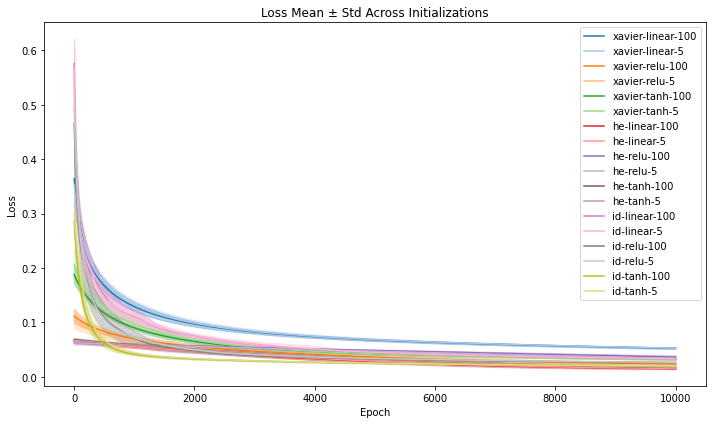

In [7]:
plot_all_loss_curves(init_groups, start_x=0)

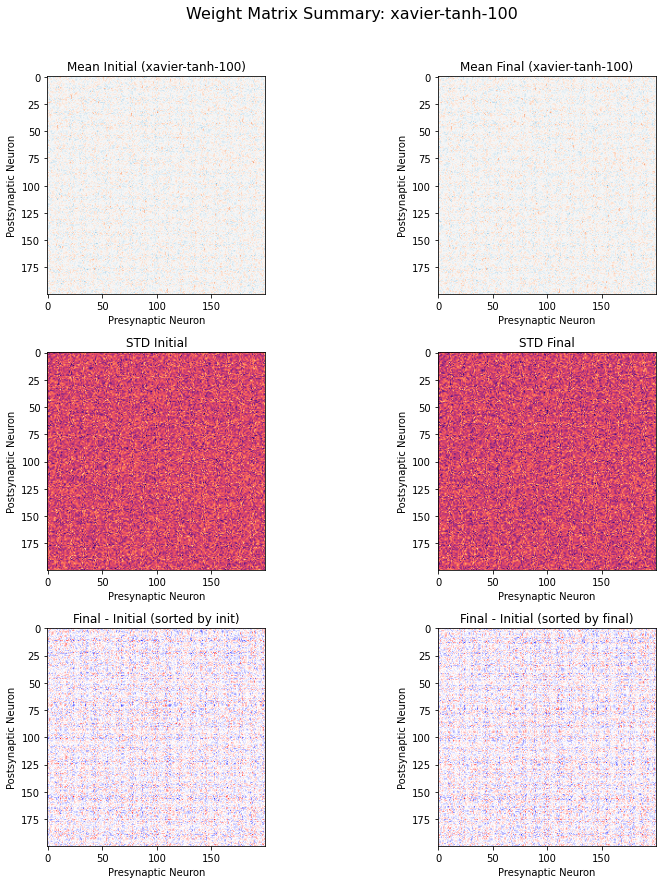

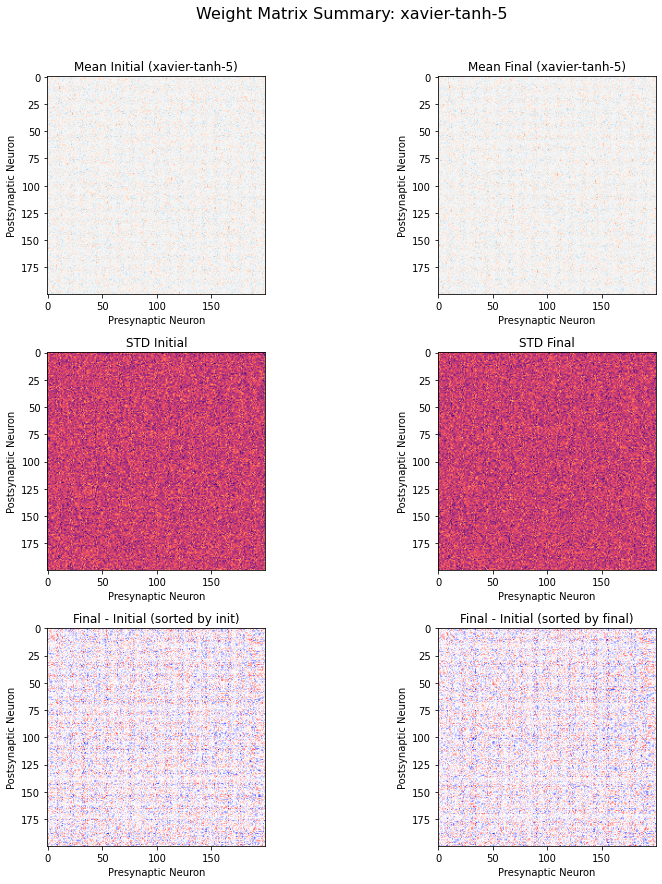

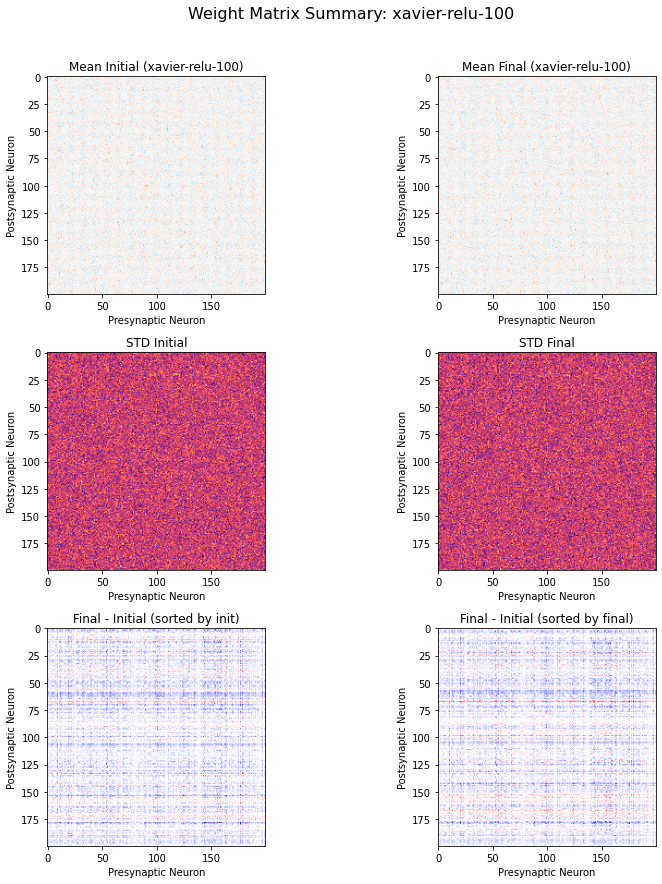

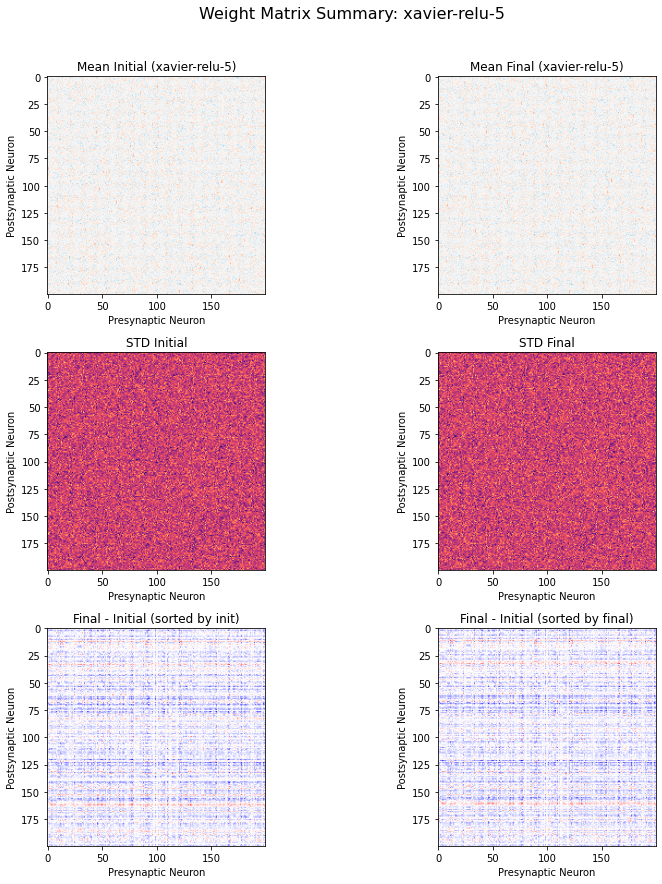

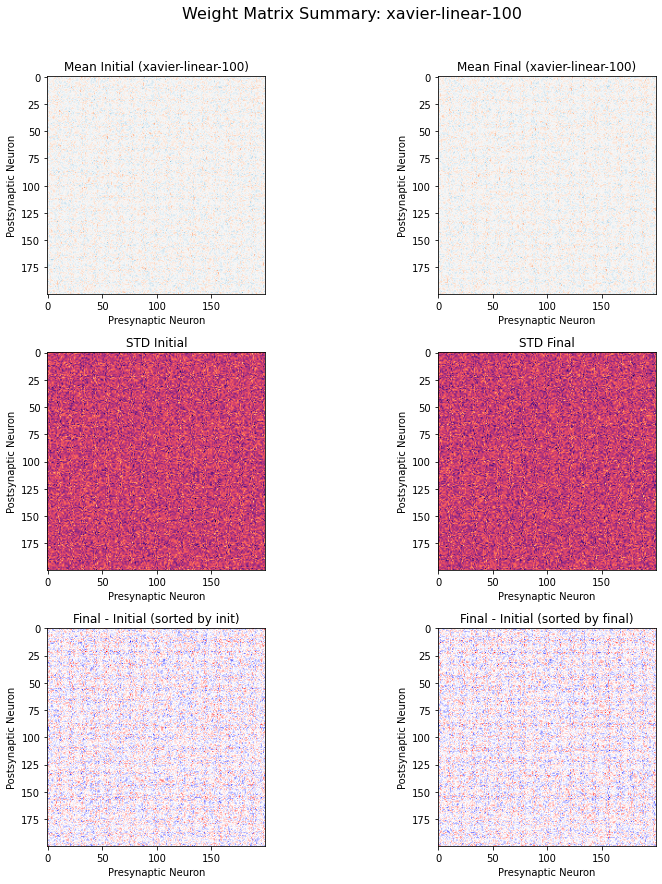

...

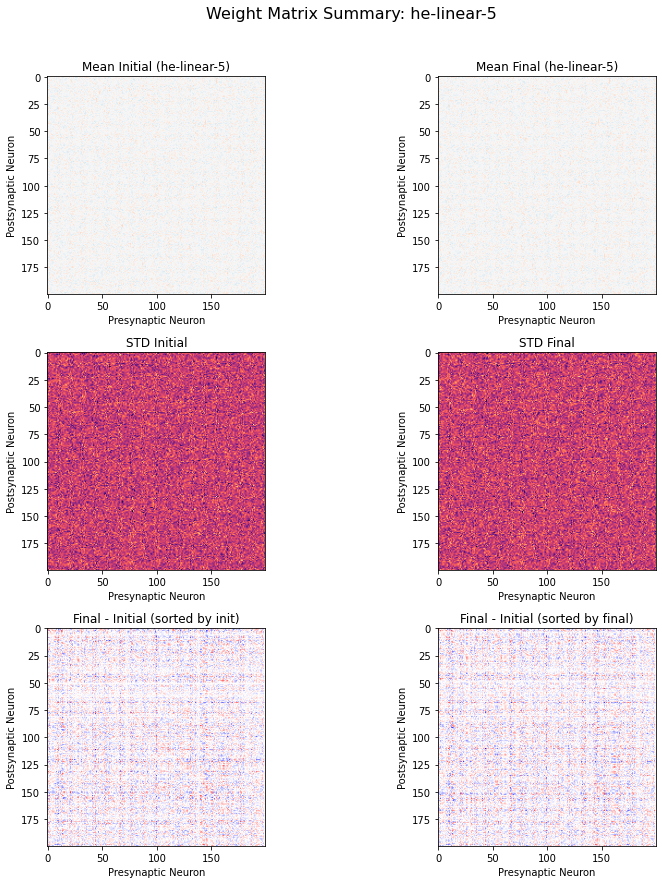

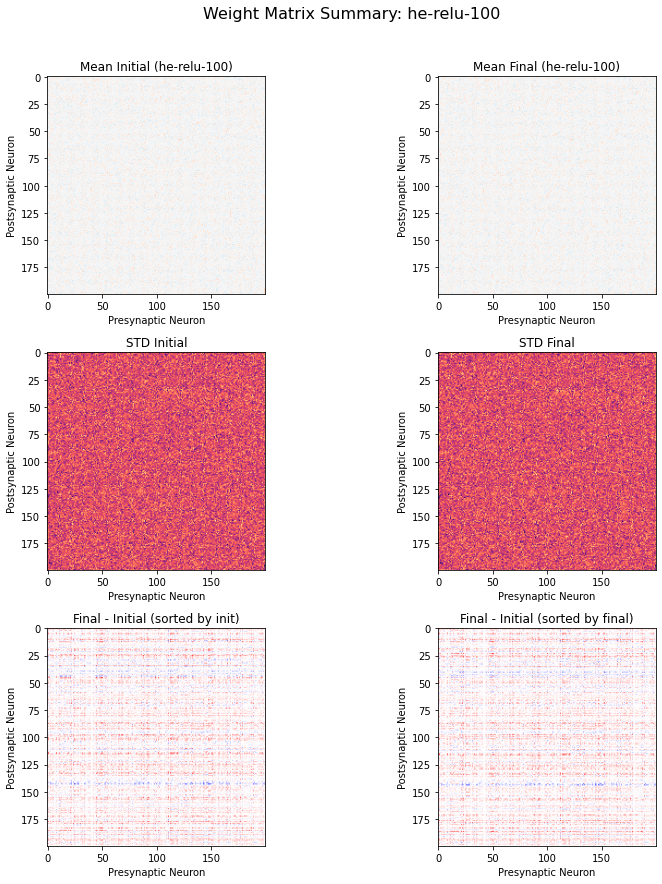

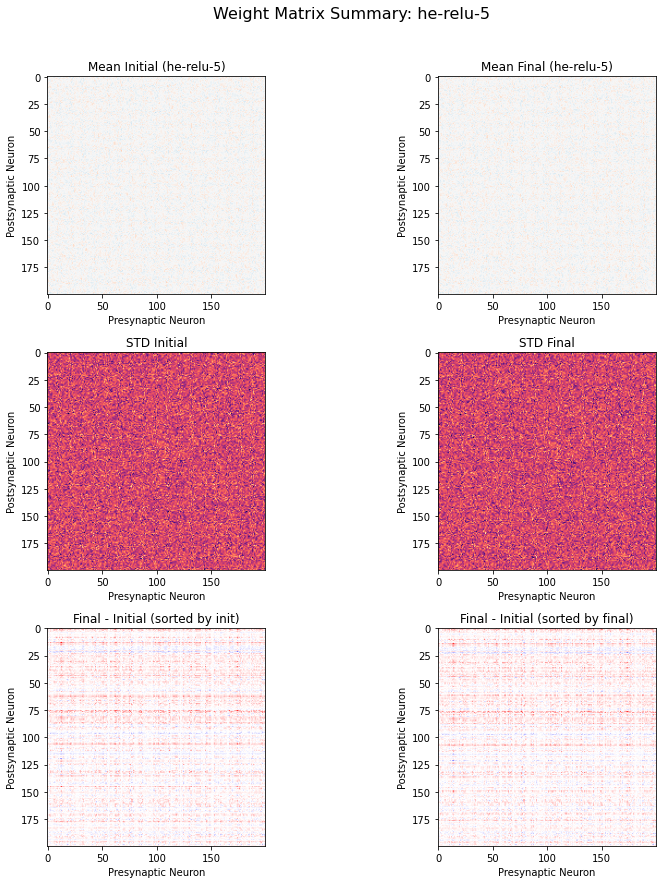

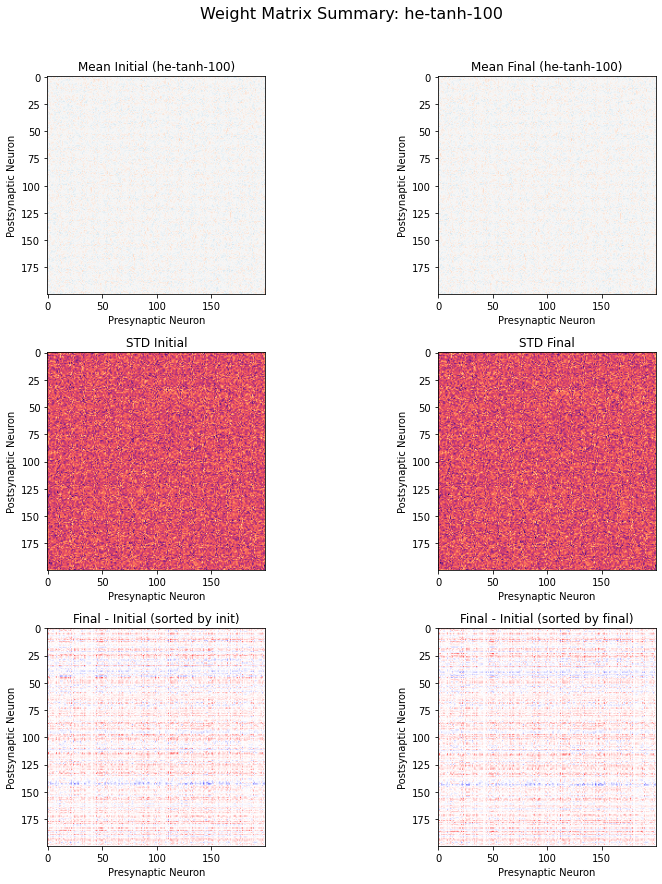

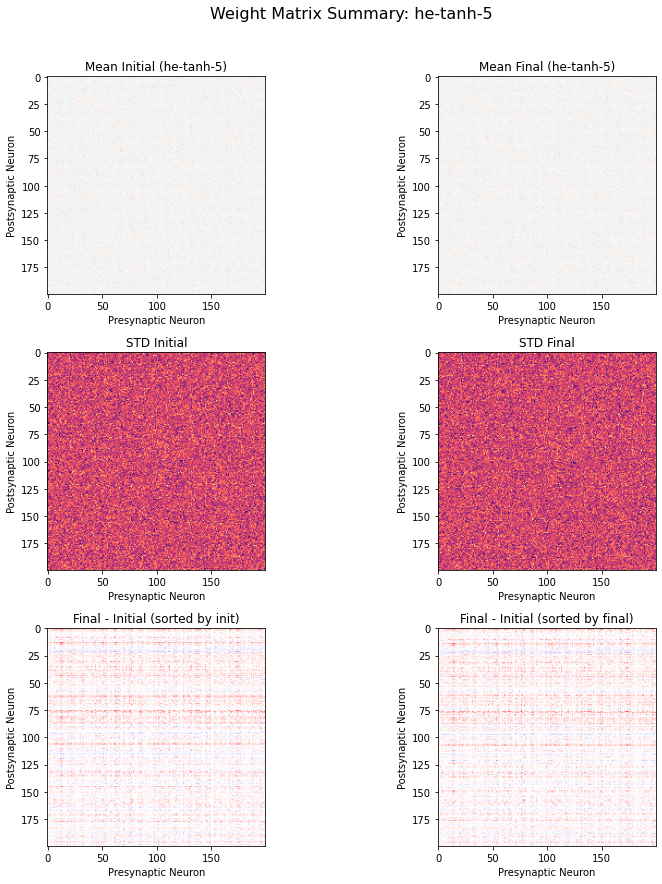

In [ ]:
for label, paths in init_groups.items():
    W_init_avg, W_final_avg, std_init, std_final, delta_W = load_weight_matrices(paths)
    plot_weight_stats(
        W_init_avg, W_final_avg, std_init, std_final, delta_W, label=label
    )